In [65]:
import os
import sys
import shutil
os.environ['TOKENIZERS_PARALLELISM'] = "False"

import torch
import pandas as pd
import numpy as np
import decord
import json
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "serif"
import PIL.Image
from glob import glob
from natsort import natsorted

import shared.utils as su
from utils.video import read_frames_decord
from utils.model import transform_pixel_values
from torchvision.transforms.v2 import (
    ToPILImage,
)

In [2]:
from models.modeling_encoders import AutoEncoder

# model_id = "/work/piyush/experiments/CaRe/Tarsier-7b/nli-9k+ego4d-1k/merged_checkpoint"
model_id = "/work/piyush/experiments/CaRe/Tarsier-7b/final-10112025/"\
    "nli_9000+ego_1000+subj_replaced-seed_42/merged_checkpoint"
encoder = AutoEncoder.from_pretrained(model_id, device_map='auto')
su.misc.num_params(encoder.model)

The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.


Loading EncoderForTarsier from /work/piyush/experiments/CaRe/Tarsier-7b/final-10112025/nli_9000+ego_1000+subj_replaced-seed_42/merged_checkpoint
### do_image_padding is set as False, images will be resized directly!


The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.
TarsierForConditionalGeneration has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.
You are attempting to use Flash Attention 2.

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

::: Number of total parameters in TarsierForConditionalGeneration: 7063.427M


### Load data

In [3]:
data_dir = "/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/egocvr"
clip_dir = f"{data_dir}/clips"
save_dir = f"{data_dir}/embs"

df_anno = pd.read_csv(f"{data_dir}/egocvr_annotations.csv")
df_base = pd.read_csv(f"{data_dir}/egocvr_data.csv")
df_gall = pd.read_csv(f"{data_dir}/egocvr_annotations_gallery.csv")

df_anno.shape, df_base.shape, df_gall.shape

((2295, 6), (12526, 3), (2295, 8))

**Load embeddings**

In [91]:
!ls $save_dir

tarsier+tara_local_gallery_candidate_embeddings_egocvr-0-15.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-0-3000.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-3000-5000.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-5000-7000.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-7000-2295.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-7000-9300.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-frames_15-0-10.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-frames_15-0-3000.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-frames_15-3000-6000.pt
tarsier+tara_local_gallery_candidate_embeddings_egocvr-frames_15-6000-9300.pt
tarsier+tara_query_embeddings_egocvr-frames_15.pt
tarsier+tara_query_embeddings_egocvr.pt


In [158]:
candidate_embedding_files = glob(
    f"{save_dir}/tarsier+tara_local_gallery_candidate_embeddings_egocvr*.pt"
)
candidate_embedding = {}
for f in candidate_embedding_files:
    candidate_embedding.update(torch.load(f))
len(candidate_embedding)

9140

In [159]:
query_embedding_files = glob(f"{save_dir}/tarsier+tara_query_embeddings_egocvr*.pt")
query_embedding = {}
for f in query_embedding_files:
    query_embedding.update(torch.load(f))
len(query_embedding)

2267

In [160]:
global_candidate_embedding_files = glob(
    f"{save_dir}/tarsier+tara_global_gallery_embeddings_egocvr-frames_8-*.pt"
)
global_candidate_embedding = {}
for f in global_candidate_embedding_files:
    global_candidate_embedding.update(torch.load(f))
len(global_candidate_embedding)

10666

### Local

In [161]:
from difflib import SequenceMatcher

def find_best_match_index(search_string, string_list):
    """
    Find the index of the best matched string in the list.
    
    Converts list items from format 'uuid_start-decimal_end-decimal' 
    to 'uuid_start_end' before comparing with search_string.
    
    Args:
        search_string: String to search for (e.g., '41ce196f-1726-4077-887f-060674b4f338_57_66')
        string_list: List of strings to search in
        
    Returns:
        Index of the best matched string, or -1 if list is empty
    """
    if not string_list:
        return -1
    
    def normalize_string(s):
        """Convert '41ce196f-1726-4077-887f-060674b4f338_57-233_65-233' 
        to '41ce196f-1726-4077-887f-060674b4f338_57_65'"""
        parts = s.split('_')
        if len(parts) >= 3:
            # Extract the numeric parts before the dash
            start = parts[-2].split('-')[0]
            end = parts[-1].split('-')[0]
            # Reconstruct with just the base numbers
            uuid_part = '_'.join(parts[:-2])
            return f"{uuid_part}_{start}_{end}"
        return s
    
    best_index = 0
    best_ratio = 0
    
    for i, candidate in enumerate(string_list):
        normalized = normalize_string(candidate)
        ratio = SequenceMatcher(None, search_string, normalized).ratio()
        
        if ratio > best_ratio:
            best_ratio = ratio
            best_index = i
    
    return best_index


# Example usage
if __name__ == "__main__":
    search_string = '41ce196f-1726-4077-887f-060674b4f338_57_66'
    string_list = [
        '41ce196f-1726-4077-887f-060674b4f338_213-667_221-667',
        '41ce196f-1726-4077-887f-060674b4f338_143-033_151-033',
        '41ce196f-1726-4077-887f-060674b4f338_248-333_256-333',
        '41ce196f-1726-4077-887f-060674b4f338_111-833_119-833',
        '41ce196f-1726-4077-887f-060674b4f338_165-533_173-533',
        '41ce196f-1726-4077-887f-060674b4f338_57-233_65-233',
        '41ce196f-1726-4077-887f-060674b4f338_18_27'
    ]
    
    result = find_best_match_index(search_string, string_list)
    print(f"Best match index: {result}")
    print(f"Best match: {string_list[result]}")

Best match index: 5
Best match: 41ce196f-1726-4077-887f-060674b4f338_57-233_65-233


In [171]:
K = [1, 2, 3]
local_metrics = {f'R@{k}': [] for k in K}
for i in su.log.tqdm_iterator(range(len(df_gall)), desc='Computing metrics'):
    row = df_gall.iloc[i].to_dict()

    query_video_path = f"{clip_dir}/{row['video_clip_id']}.mp4"
    edit_instruction = row['instruction']

    query_key = f"{row['video_clip_id']}|{edit_instruction}"
    if query_key not in query_embedding:
        print(f"Query key {query_key} not found.")
        continue
    zq = query_embedding[query_key]
    # break

    # # local candidates
    # df_local = df_base.iloc[eval(row['local_idx'])]
    # zv_local_gallery = []
    # for clip_name in df_local.clip_name.tolist():
    #     # if clip_name not in candidate_embedding:
    #     #     print(f"clip_name {clip_name} not found. skipping.")
    #     #     continue
    #     zv = candidate_embedding[clip_name]
    #     zv_local_gallery.append(zv)
    # zv_local_gallery = torch.stack(zv_local_gallery)

    df_local = df_base.iloc[eval(row['local_idx'])]
    zv_local_gallery = torch.stack(df_local.clip_name.map(candidate_embedding).tolist())


    sim = zq @ zv_local_gallery.T
    # golden_index = find_best_match_index(row['video_clip_id'], df_local.clip_name.tolist())
    indices = np.where(df_local.clip_name_clean.isin(eval(row['target_clip_ids'])))[0]
    ranked_indices = sim.argsort(descending=True)
    for k in K:
        # local_metrics[f'R@{k}'].append(golden_index in ranked_indices[:k])
        local_metrics[f'R@{k}'].append(
            len(set(indices).intersection(set(ranked_indices[:k].numpy().astype(int)))) > 0
        )
len(local_metrics)

Computing metrics:   0%|          | 0/2295 [00:00<?, ?it/s]

Query key df7bdd06-c392-4a3d-ae1a-cdc234582472_107_115|Pause the action. not found.
Query key 2dd04abb-859f-4121-9eeb-4db511b54c7b_171_177|Dip it into paint. not found.
Query key 041b9423-9695-45cb-bc58-266af7f91039_90_99|Clean the floor with it. not found.
Query key a5fe04fd-4224-4a95-a3df-33d339570a0d_449_456|Touch the black paint instead. not found.
Query key e8283c8f-ecc0-448a-84d2-9f16160d7a4b_521_530|Wipe the blade instead. not found.
Query key 48ca7acc-2b9c-46a9-ab11-be03bd1324d9_1063_1069|Place it on the ground. not found.
Query key f4251612-a623-40a0-9fc4-2016c4aa607d_641_650|Remove the bin instead. not found.
Query key 099f6f96-5aa7-4da8-a5e0-2e8bc03beee6_1308_1313|Pick up the mat. not found.
Query key f79614b9-8c45-40f4-b1f3-a9f44428498e_81_89|Loosen the screw with the other hand. not found.
Query key 6b7263dd-0354-468b-a485-0471ace84f15_348_356|Retrieve it from the cabinet. not found.
Query key 7d2060fa-501e-46db-9d7a-aa0c634889c4_96_104|Insert the pin with the other hand. 

3

In [172]:
for k in local_metrics:
    print(k, np.round(np.array(local_metrics[k]).mean() * 100., 2))

R@1 28.7
R@2 48.06
R@3 62.41


In [115]:
def get_clip_name_clean(x):
    a, b, c = x.split("_")
    b = b.split('-')[0]
    c = c.split('-')[0]
    return '_'.join([a, b, c])


df_base['clip_name_clean'] = df_base.clip_name.apply(lambda x: get_clip_name_clean(x))
df_base.shape

(12526, 4)

In [156]:
df_local.clip_name.apply(lambda x: x in global_candidate_embedding).mean()

np.float64(1.0)

In [157]:
K = [1, 5, 10]
global_metrics = {f'R@{k}': [] for k in K}
for i in su.log.tqdm_iterator(range(len(df_gall)), desc='Computing metrics'):
    row = df_gall.iloc[i].to_dict()

    query_video_path = f"{clip_dir}/{row['video_clip_id']}.mp4"
    edit_instruction = row['instruction']

    query_key = f"{row['video_clip_id']}|{edit_instruction}"
    if query_key not in query_embedding:
        print(f"Query key {query_key} not found.")
        continue
    zq = query_embedding[query_key]

    df_local = df_base.iloc[eval(row['global_idx'])]
    # df_local = df_local[df_local.clip_name.apply(lambda x: x in global_candidate_embedding)]
    zv_local_gallery = torch.stack(df_local.clip_name.map(global_candidate_embedding).tolist())

    sim = zq @ zv_local_gallery.T
    ranked_indices = sim.argsort(descending=True)

    # break
    # golden_index = find_best_match_index(row['video_clip_id'], df_local.clip_name.tolist())
    indices = np.where(df_local.clip_name_clean.isin(eval(row['target_clip_ids'])))[0]
    
    for k in K:
        global_metrics[f'R@{k}'].append(
            len(set(indices).intersection(set(ranked_indices[:k].numpy().astype(int)))) > 0
        )

for k in global_metrics:
    print(k, np.round(np.array(global_metrics[k]).mean() * 100., 2))

Computing metrics:   0%|          | 0/2295 [00:00<?, ?it/s]

Query key df7bdd06-c392-4a3d-ae1a-cdc234582472_107_115|Pause the action. not found.
Query key 2dd04abb-859f-4121-9eeb-4db511b54c7b_171_177|Dip it into paint. not found.
Query key 041b9423-9695-45cb-bc58-266af7f91039_90_99|Clean the floor with it. not found.
Query key a5fe04fd-4224-4a95-a3df-33d339570a0d_449_456|Touch the black paint instead. not found.
Query key e8283c8f-ecc0-448a-84d2-9f16160d7a4b_521_530|Wipe the blade instead. not found.
Query key 48ca7acc-2b9c-46a9-ab11-be03bd1324d9_1063_1069|Place it on the ground. not found.
Query key f4251612-a623-40a0-9fc4-2016c4aa607d_641_650|Remove the bin instead. not found.
Query key 099f6f96-5aa7-4da8-a5e0-2e8bc03beee6_1308_1313|Pick up the mat. not found.
Query key f79614b9-8c45-40f4-b1f3-a9f44428498e_81_89|Loosen the screw with the other hand. not found.
Query key 6b7263dd-0354-468b-a485-0471ace84f15_348_356|Retrieve it from the cabinet. not found.
Query key 7d2060fa-501e-46db-9d7a-aa0c634889c4_96_104|Insert the pin with the other hand. 

In [124]:
row['video_clip_id']

'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980'

In [140]:
indices = np.where(df_local.clip_name_clean.isin(eval(row['target_clip_ids'])))[0]
set(indices).intersection(set(ranked_indices[:10].item()))

set()

{np.int64(0)}

In [146]:
set(ranked_indices[:10].numpy().astype(int))

{np.int64(0),
 np.int64(740),
 np.int64(2565),
 np.int64(2569),
 np.int64(2585),
 np.int64(3054),
 np.int64(7196),
 np.int64(7197),
 np.int64(9230),
 np.int64(9234)}

In [141]:
indices

array([0])

In [129]:
(eval(row['target_clip_ids'])[0] == df_local.clip_name_clean)

['d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906']

In [126]:
golden_index = find_best_match_index(row['video_clip_id'], df_local.clip_name_clean.tolist())
golden_index

0

In [125]:
df_local.clip_name_clean

1          d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906
2          33052ab8-d0af-414c-8655-3046c6990f3c_298_307
3          33052ab8-d0af-414c-8655-3046c6990f3c_243_252
7          d0b0a1c5-d1a5-4cdb-8f15-c12d3c57cc24_129_138
8          d0b0a1c5-d1a5-4cdb-8f15-c12d3c57cc24_144_153
                              ...                      
12520    ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_1641_1649
12521      ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_191_199
12523        ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_15_23
12524      ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_257_265
12525      ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_159_167
Name: clip_name_clean, Length: 11308, dtype: object

In [123]:
np.where(df_local.clip_name_clean == row['video_clip_id'])

(array([], dtype=int64),)

In [120]:
row['video_clip_id']

'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980'

In [119]:
ranked_indices = sim.argsort(descending=True)
ranked_indices

tensor([9234, 9230,    0,  ..., 3034, 3042, 9851])

In [112]:
sim = zq @ zv_local_gallery.T
sim.shape

torch.Size([10523])

In [113]:
sim

tensor([0.7130, 0.2533, 0.2192,  ..., 0.1654, 0.1013, 0.1443])

In [110]:
sim

tensor([0.4735, 0.4656, 0.4618, 0.4453, 0.4982, 0.8887, 0.7913])

In [88]:
def get_clip_name_clean(x):
    a, b, c = x.split("_")
    b = b.split('-')[0]
    c = c.split('-')[0]
    return '_'.join([a, b, c])


df_base['clip_name_clean'] = df_base.clip_name.apply(lambda x: get_clip_name_clean(x))
df_base.clip_name_clean.apply(lambda x: x not in candidate_embedding).sum()

np.int64(10717)

In [89]:
su.io.save_txt(
    list(df_base[df_base.clip_name_clean.apply(lambda x: x not in candidate_embedding)].clip_name_clean.unique()),
    '../assets/ego4d_clips_to_cut-v2.txt'
)


In [63]:
import numpy as np
import torch

K = [1, 5, 10]
global_metrics = {f'R@{k}': [] for k in K}

# Pre-compute candidate_embedding_set for faster lookup
candidate_embedding_set = set(candidate_embedding.keys())

# Convert to numpy arrays for faster iteration
df_gall_values = df_gall.values
df_gall_columns = df_gall.columns.tolist()
video_clip_id_idx = df_gall_columns.index('video_clip_id')
instruction_idx = df_gall_columns.index('instruction')
global_idx_idx = df_gall_columns.index('global_idx')

# Pre-extract df_base values
df_base_clip_names = df_base['clip_name'].values

for i in su.log.tqdm_iterator(range(len(df_gall)), desc='Computing metrics'):
    row_values = df_gall_values[i]
    video_clip_id = row_values[video_clip_id_idx]
    edit_instruction = row_values[instruction_idx]
    global_idx_str = row_values[global_idx_idx]
    
    query_key = f"{video_clip_id}|{edit_instruction}"
    if query_key not in query_embedding:
        print(f"Query key {query_key} not found.")
        continue
    
    zq = query_embedding[query_key]
    
    # Parse global_idx once
    global_indices = eval(global_idx_str)
    
    # Filter clip names using set intersection (much faster)
    local_clip_names = df_base_clip_names[global_indices]
    valid_mask = np.array([name in candidate_embedding_set for name in local_clip_names])
    valid_clip_names = local_clip_names[valid_mask]
    
    if len(valid_clip_names) == 0:
        continue
    
    # Stack embeddings (already optimized)
    zv_local_gallery = torch.stack([candidate_embedding[name] for name in valid_clip_names])
    
    # Compute similarity
    sim = zq @ zv_local_gallery.T
    
    # Find golden index using optimized search
    golden_index = find_best_match_index(video_clip_id, valid_clip_names.tolist())
    
    # Get ranked indices
    ranked_indices = sim.argsort(descending=True)
    
    # Check all K values at once using tensor operations
    ranked_indices_np = ranked_indices.cpu().numpy() if ranked_indices.is_cuda else ranked_indices.numpy()
    for k in K:
        global_metrics[f'R@{k}'].append(golden_index in ranked_indices_np[:k])

# Print results
for k in K:
    metric_key = f'R@{k}'
    print(metric_key, np.round(np.array(global_metrics[metric_key]).mean() * 100., 2))

Computing metrics:   0%|          | 0/2295 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [46]:
global_metrics

{'R@1': [False], 'R@5': [True], 'R@10': [True]}

In [41]:
candidate_embedding[df_global.clip_name.iloc[100]]

tensor([ 0.0008,  0.0008, -0.0116,  ...,  0.0079,  0.0140,  0.0306])

In [21]:
len()

2272

#### Local retrieval

In [4]:
df_base

,clip_name,narration_text,video_uid
0,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980,#C C takes the sieve,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
1,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906,#C C shakes the sieve,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
2,33052ab8-d0af-414c-8655-3046c6990f3c_298_307,#C C holds the basket of flowers on the floor ...,33052ab8-d0af-414c-8655-3046c6990f3c
3,33052ab8-d0af-414c-8655-3046c6990f3c_243_252,#C C puts the white flowers on the tray with h...,33052ab8-d0af-414c-8655-3046c6990f3c
4,124d8745-52d7-464c-bb46-65b96bbdcffa_1815_1824,#C C types on the keyboard,124d8745-52d7-464c-bb46-65b96bbdcffa
...,...,...,...
12521,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_191-8_199-8,#C C walks forward,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635
12522,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_285-933_2...,#C C shakes the mat,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635
12523,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_15-333_23...,#C C lifts the machine up,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635
12524,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_257-433_2...,#C C moves hand down,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635


In [5]:
df_anno.iloc[0]

video_clip_id                d1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980
target_clip_ids          ['d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906']
video_clip_narration                                 #C C takes the sieve
target_clip_narration                               #C C shakes the sieve
instruction                                                     Shake it.
modified_captions                                   #C C shakes the bowl.
Name: 0, dtype: object

In [6]:
len(np.unique(eval(df_gall.global_idx[0])))

12500

In [7]:
df_gall.iloc[0]

video_clip_id                 d1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980
target_clip_ids           ['d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906']
video_clip_narration                                  #C C takes the sieve
target_clip_narration                                #C C shakes the sieve
instruction                                                      Shake it.
modified_captions                                    #C C shakes the bowl.
global_idx               [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...
local_idx                    [1, 10436, 10437, 10438, 10439, 10440, 10441]
Name: 0, dtype: object

In [8]:
fullvid_dir = "/scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/full_scale"

def load_local_gallery_video(clip_name, n_frames=8, as_tensor=False):
    video_id, st, et = clip_name.split("_")
    st = float(st.split('-')[0])
    et = float(et.split('-')[0])
    video_path = f"{fullvid_dir}/{video_id}.mp4"
    frames = su.video.load_frames_linspace(
        video_path, st=st, et=et, n=n_frames, width=360, height=240,
    )
    if as_tensor:
        frames = torch.from_numpy(np.stack([np.asarray(x) for x in frames]))
        frames = frames.permute((0, 3, 1, 2))
    return frames

In [9]:


PROMPT = "<video>\nEdit instruction: <sent>\n"\
         "Imagine the given text edit instruction applied on the given video.\n"\
         "Summarize the resulting video in one word:"
PROMPT = f"USER: {PROMPT} ASSISTANT: "
print(PROMPT)


def embed_video_text(video_path, edit_text, n_frames=8, verbose=False):
    generate_kwargs = {
        "max_new_tokens": 1,
        "output_hidden_states": True,
        "return_dict_in_generate": True,
    }

    # Prepare video
    pixel_values = read_frames_decord(video_path, n_frames).unsqueeze(0)
    pixel_values = transform_pixel_values(pixel_values)
    nframes = pixel_values.shape[1]
    to_image = ToPILImage()
    batched_frames = []
    for batch in pixel_values:
        frames = [to_image(v) for v in batch]
        batched_frames.append(frames)

    for frames in batched_frames:

        # Video
        input_prompt = PROMPT.replace("<video>", "<image>"*len(frames))

        # Text
        input_prompt = input_prompt.replace('<sent>', edit_text)

        if verbose:
            print(input_prompt)

        input_ids = encoder.processor.get_text_inputs(input_prompt)
        frames = encoder.processor.get_pixel_values(frames)
        inputs = {
            "input_ids": input_ids,
            "pixel_values": frames
        }
        inputs = {k:v.to(encoder.model.device) for k,v in inputs.items() if v is not None}
        outputs = encoder.model.generate(
            **inputs,
            **generate_kwargs,
        )
        zv = outputs.hidden_states[0][-1][:, -1, :]
        break # Safe to break since it is just one video

    if verbose:
        print(zv.shape)

    return zv.squeeze(0)

USER: <video>
Edit instruction: <sent>
Imagine the given text edit instruction applied on the given video.
Summarize the resulting video in one word: ASSISTANT: 


In [20]:
sim.argsort(descending=True)

tensor([0, 2, 3, 4, 6, 5, 1])

In [ ]:
query_embeddings = {}
for i in su.log.tqdm_iterator(range(len(df_gall))):
    row = df_gall.iloc[i].to_dict()
    
    query_video_path = f"{clip_dir}/{row['video_clip_id']}.mp4"
    edit_instruction = row['instruction']
    zq = embed_video_text(query_video_path, edit_instruction)
    zq = torch.nn.functional.normalize(zq, dim=-1)
    zq = zq.cpu().float()
    query_embeddings[f"{row['video_clip_id']}|{edit_instruction}"] = zq

In [25]:
K = [1, 2, 3]
local_metrics = {f'R@{k}': [] for k in K}
for i in su.log.tqdm_iterator(range(len(df_gall))):
    row = df_gall.iloc[i].to_dict()
    
    query_video_path = f"{clip_dir}/{row['video_clip_id']}.mp4"
    edit_instruction = row['instruction']
    zq = embed_video_text(query_video_path, edit_instruction)
    zq = torch.nn.functional.normalize(zq, dim=-1)
    zq = zq.cpu().float()

    # local candidates
    df_local = df_base.iloc[eval(row['local_idx'])]
    zv_local_gallery = []
    for clip_name in df_local.clip_name.tolist():
        video_tensor = load_local_gallery_video(clip_name, as_tensor=True)
        with torch.no_grad():
            zv = encoder.encode_vision(video_tensor.unsqueeze(0))
            zv = torch.nn.functional.normalize(zv, dim=-1).cpu().squeeze(0).float()
        zv_local_gallery.append(zv)
    zv_local_gallery = torch.stack(zv_local_gallery)

    sim = zq @ zv_local_gallery.T
    ranked_indices = sim.argsort(descending=True)
    for k in K:
        local_metrics[f'R@{k}'].append(0 in ranked_indices[:k])
    break
local_metrics

  0%|          | 0/2295 [00:00<?, ?it/s]

{'R@1': [True], 'R@2': [True], 'R@3': [True]}

In [38]:
local_clip_names = []
for i in range(len(df_gall)):
    row = df_gall.iloc[i].to_dict()

    # local candidates
    df_local = df_base.iloc[eval(row['local_idx'])]
    local_clip_names.extend(df_local.clip_name.tolist())
local_clip_names = np.unique(np.array(local_clip_names))
print("Total number of local clips in gallery: ", len(local_clip_names))


Total number of local clips in gallery:  9140


In [39]:
local_clip_names

array(['002c3b5c-ed86-4af3-99a1-4b497b7c8a86_2396_2405',
       '002c3b5c-ed86-4af3-99a1-4b497b7c8a86_2401-488_2409-488',
       '002c3b5c-ed86-4af3-99a1-4b497b7c8a86_2410-888_2418-888', ...,
       'ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_289-733_297-733',
       'ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_36-967_44-967',
       'ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_91_100'], dtype='<U56')

In [40]:
cleaned_local_clip_names = []
for x in local_clip_names:
    a, b, c = x.split('_')
    b = b.split("-")[0]
    c = c.split("-")[0]
    y = '_'.join([a, b, c])
    cleaned_local_clip_names.append(y)
cleaned_local_clip_names = np.unique(np.array(cleaned_local_clip_names))
len(cleaned_local_clip_names)

9067

In [42]:
su.io.save_txt(list(cleaned_local_clip_names), '../assets/ego4d_clips_to_cut.txt')

In [37]:


local_clip_names = []
for i in range(len(df_gall)):
    row = df_gall.iloc[i].to_dict()

    # local candidates
    df_local = df_base.iloc[eval(row['local_idx'])]
    local_clip_names.extend(df_local.clip_name.tolist())
local_clip_names = np.unique(np.array(local_clip_names))
print("Total number of local clips in gallery: ", len(local_clip_names))

video_embeddings_local_clips = {}
iterator = su.log.tqdm_iterator(local_clip_names, desc='Computing video features (local clips)')
for clip_names in iterator:
    video_tensor = load_local_gallery_video(clip_name, as_tensor=True)
    with torch.no_grad():
        zv = encoder.encode_vision(video_tensor.unsqueeze(0))
        zv = torch.nn.functional.normalize(zv, dim=-1).cpu().squeeze(0).float()
    video_embeddings_local_clips[i] = zv
    

9140

In [32]:
indices = np.unique(np.array(df_gall.local_idx.apply(lambda x: eval(x)).sum()))
len(indices), indices[:5]

(10158, array([0, 1, 2, 3, 4]))

In [31]:
video_embeddings_gallery = {}
iterator = su.log.tqdm_iterator(indices, desc='Computing video features (local gallery)')
for i in iterator:
    row = df_base.iloc[i].to_dict()
    clip_name = row['clip_name']
    video_tensor = load_local_gallery_video(clip_name, as_tensor=True)
    with torch.no_grad():
        zv = encoder.encode_vision(video_tensor.unsqueeze(0))
        zv = torch.nn.functional.normalize(zv, dim=-1).cpu().squeeze(0).float()
    video_embeddings_gallery[i] = zv
    break

Computing video features (local gallery):   0%|          | 0/14679 [00:00<?, ?it/s]

In [34]:
df_base

,clip_name,narration_text,video_uid
0,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980,#C C takes the sieve,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
1,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906,#C C shakes the sieve,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
2,33052ab8-d0af-414c-8655-3046c6990f3c_298_307,#C C holds the basket of flowers on the floor ...,33052ab8-d0af-414c-8655-3046c6990f3c
3,33052ab8-d0af-414c-8655-3046c6990f3c_243_252,#C C puts the white flowers on the tray with h...,33052ab8-d0af-414c-8655-3046c6990f3c
4,124d8745-52d7-464c-bb46-65b96bbdcffa_1815_1824,#C C types on the keyboard,124d8745-52d7-464c-bb46-65b96bbdcffa
...,...,...,...
12521,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_191-8_199-8,#C C walks forward,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635
12522,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_285-933_2...,#C C shakes the mat,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635
12523,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_15-333_23...,#C C lifts the machine up,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635
12524,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635_257-433_2...,#C C moves hand down,ffb6dfc1-d2f9-45b1-8e25-2c7d0f32d635


In [24]:
df_local.clip_name.tolist()

['d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_996-021',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_980-354_988-354',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1024-054_1032-054',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1056-307_1064-307',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_998-888_1006-888',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1006-321_1014-321']

In [23]:
sim

tensor([0.3988, 0.6796, 0.5736, 0.4210, 0.5842, 0.7953, 0.9982])

In [22]:
ranked_indices

tensor([6, 5, 1, 4, 2, 3, 0])

In [14]:
zq.device

device(type='cuda', index=0)

0

In [16]:
sim = zq.cpu().float() @ zv_local_gallery.T
sim

tensor([78.6799, 49.8143, 62.9102, 62.4324, 60.5296, 50.8632, 51.6925])

In [65]:
row.keys()

dict_keys(['video_clip_id', 'target_clip_ids', 'video_clip_narration', 'target_clip_narration', 'instruction', 'modified_captions', 'global_idx', 'local_idx'])

**Source caption**: #C C takes the sieve

**Target caption**: #C C shakes the sieve

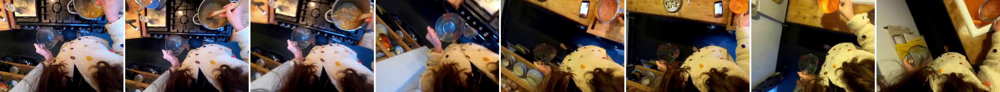

In [66]:
display(Markdown(f"**Source caption**: {row['video_clip_narration']}"))
display(Markdown(f"**Target caption**: {row['target_clip_narration']}"))
display(
    su.visualize.concat_images_with_border(
        su.video.load_frames_linspace(query_video_path, n=8)
    )
)

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906

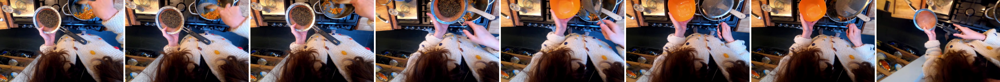

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_996-021

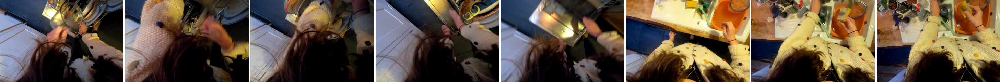

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_980-354_988-354

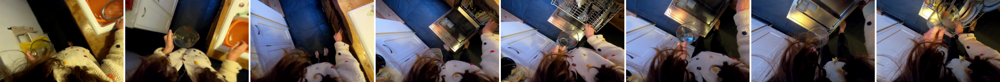

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_1024-054_1032-054

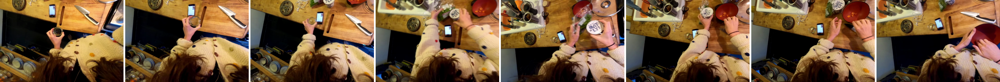

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_1056-307_1064-307

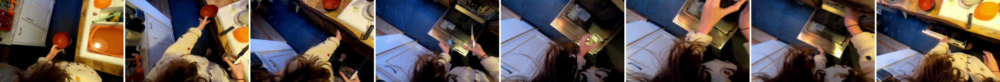

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_998-888_1006-888

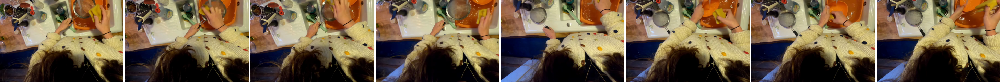

d1d1b6da-e7f8-48e7-9ee4-d8382582695a_1006-321_1014-321

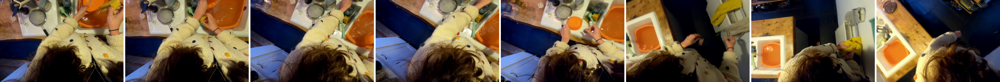

In [67]:
for j in range(len(df_local)):
    display(Markdown(df_local.clip_name.iloc[j]))
    frames = load_local_gallery_video(df_local.clip_name.iloc[j])
    display(su.visualize.concat_images_with_border(frames))

In [61]:
df_local

,clip_name,narration_text,video_uid
1,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906,#C C shakes the sieve,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
10436,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_9...,#C C pushes the drawer in the cupboard,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
10437,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_980-354_9...,#C C pulls the drawer out,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
10438,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_1024-054_...,#C C takes the packet of vegetable,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
10439,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_1056-307_...,#C C puts the knife in the drawer,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
10440,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_998-888_1...,#C C picks the bowl,d1d1b6da-e7f8-48e7-9ee4-d8382582695a
10441,d1d1b6da-e7f8-48e7-9ee4-d8382582695a_1006-321_...,#C C puts the bowl down,d1d1b6da-e7f8-48e7-9ee4-d8382582695a


In [60]:
query_video_path

'/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/egocvr/clips/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980.mp4'

In [59]:
df_local.clip_name.tolist()

['d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_996-021',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_980-354_988-354',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1024-054_1032-054',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1056-307_1064-307',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_998-888_1006-888',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1006-321_1014-321']

In [ ]:
from utils.video import read_frames_decord

        with torch.no_grad():
            zv = encoder.encode_vision(video_tensor.unsqueeze(0)).cpu().squeeze(0).float()
            zv = torch.nn.functional.normalize(zv, dim=-1)
        candidates[video] = zv
    except:
        print(f"Failed {i}.")
        continue

len(candidates)

In [58]:
frames.shape

torch.Size([8, 3, 240, 360])

In [24]:
query_video_path

'/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/egocvr/clips/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_971_980.mp4'

In [21]:
df_local.clip_name.apply(lambda x: f"{clip_dir}/{x}.mp4").iloc[1]

'/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/egocvr/clips/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_996-021.mp4'

In [23]:
for j in range(len(df_local)):
    row_ = df_local.iloc[j].to_dict()
row_

{'clip_name': 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1006-321_1014-321',
 'narration_text': '#C C puts the bowl down',
 'video_uid': 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a'}

In [28]:
gall_dir = "/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/"

x = 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_996-021'
video_id = x.split("_")[0]
video_path = f"{gall_dir}/{video_id}.mp4"
video_path

'/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale//d1d1b6da-e7f8-48e7-9ee4-d8382582695a.mp4'

In [30]:
files = glob(f"{gall_dir}/*")
len(files)

896666

In [31]:
files[0]

'/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/4cb9c654-bab3-4861-b6bb-64c890f1af0d_5510.7_5513.7.mp4'

In [29]:
!ls $video_path

ls: cannot access '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale//d1d1b6da-e7f8-48e7-9ee4-d8382582695a.mp4': No such file or directory


In [25]:
df_local.clip_name.tolist()

['d1d1b6da-e7f8-48e7-9ee4-d8382582695a_897_906',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_988-021_996-021',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_980-354_988-354',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1024-054_1032-054',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1056-307_1064-307',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_998-888_1006-888',
 'd1d1b6da-e7f8-48e7-9ee4-d8382582695a_1006-321_1014-321']

In [41]:
su.video.load_frames_linspace?

Signature:
su.video.load_frames_linspace(
    video_path,
    st=None,
    et=None,
    n=8,
    num_threads=1,
    reverse=False,
    **vr_args,
)
Docstring: <no docstring>
File:      ~/projects/CaReBench/shared/utils/video.py
Type:      function

In [42]:
import decord
vr = decord.VideoReader("/scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a.mp4")
len(vr)

31897

In [44]:
vr[0].shape

torch.Size([1440, 1920, 3])

In [46]:
1440/(1920/360)

270.0

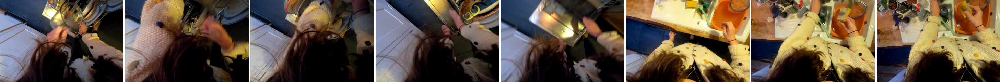

In [49]:
fullvid_dir = "/scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/full_scale"

def load_local_gallery_video(clip_name, n_frames=8):
    video_id, st, et = clip_name.split("_")
    st = float(st.split('-')[0])
    et = float(et.split('-')[0])
    video_path = f"{fullvid_dir}/{video_id}.mp4"
    frames = su.video.load_frames_linspace(
        video_path, st=st, et=et, n=n_frames, width=360, height=240,
    )
    return frames


frames = load_local_gallery_video(df_local.clip_name.iloc[1])
su.visualize.concat_images_with_border(frames)

In [40]:
fullvid_dir = "/scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/full_scale"
f"{fullvid_dir}/{video_id}.mp4"

'/scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a.mp4'

In [39]:
!ls /scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/clips/d1d1b6da-e7f8-48e7-9ee4-d8382582695a.mp4

ls: cannot access '/scratch/shared/beegfs/shared-datasets/EGO4D/ego4d_data_v1/clips//d1d1b6da-e7f8-48e7-9ee4-d8382582695a.mp4': No such file or directory


In [32]:
f"{gall_dir}/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988.0_996.0.mp4"

'/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale//d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988.0_996.0.mp4'

In [37]:
subfiles = natsorted(glob("/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a*"))
subfiles

['/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_4.6_5.8.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_4.7_5.7.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_6.7_7.7.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_6.7_7.8.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_14.1_15.1.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_17.2_18.1.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_18.9_19.9.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale/d1d1b6da-e7f8-48e7-9ee4-d8382582695a_19.2_20.4.mp4',
 '/scratch/shared/beegfs/piyush/datasets/Ego4D-H

In [35]:
!ls /scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale//d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988.1_996.1.mp4

ls: cannot access '/scratch/shared/beegfs/piyush/datasets/Ego4D-HCap/cut_full_scale//d1d1b6da-e7f8-48e7-9ee4-d8382582695a_988.1_996.1.mp4': No such file or directory
